# **Pre-trained VGG-19 model trained on the KDEF dataset with input image resolution of 28x28.**

In [1]:
!pip install tensorboardX

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 2.3 MB/s eta 0:00:00


In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
from torch.utils.data import Dataset
import os
import copy
from tensorboardX import SummaryWriter
from PIL import Image
import torchvision.transforms as transforms
import random
plt.ion()   # interactive mode
%matplotlib inline

In [3]:
# Set fixed seed for reproducibility
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [4]:
from zipfile import ZipFile
import os

zip_path = '/content/KEDF_downsample_28x28.zip'

extract_to = '/content'

os.makedirs(extract_to, exist_ok=True)

with ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print(f'✅ Files extracted to: {extract_to}')

✅ Files extracted to: /content


In [5]:
import os

classes = {
    "AF": 0, "AN": 1, "DI": 2, "HA": 3, "NE": 4, "SA": 5, "SU": 6
}

root='/content/KEDF_downsample_28x28'
invalid_files = []

for path, subdirs, files in os.walk(root):
    for name in files:
        if len(name) >= 6:
            emotion_code = name[4:6]
            if emotion_code not in classes:
                invalid_files.append(os.path.join(path, name))

# Print the problematic files
print("Found {} problematic files:".format(len(invalid_files)))
for file in invalid_files:
    print(file)

Found 0 problematic files:


In [6]:
class KDEFDataset(Dataset):
    def __init__(self, root='/content/KEDF_downsample_28x28', transforms_=None, idx=[]):
        self.transform = transforms_
        self.files = []

        for path, subdirs, files in os.walk(root):
            for name in files:
                self.files.append(os.path.join(path, name))

        self.files =  [self.files[i] for i in idx]
        self.classes = {
             "AF":0,
             "AN":1,
             "DI":2,
             "HA":3,
             "NE":4,
             "SA":5,
             "SU":6
        }
        for f in self.files:
          name = f.split('/')[-1]
          emotion_code = name[4:6]
          if emotion_code not in self.classes:
              print(f"Invalid file: {f} (code: {emotion_code})")

        for index in range(4900):
            filepath = self.files[index % len(self.files)]
            filename = filepath.split('/')[-1]
            if filename[4:6] not in self.classes:
                print(filepath)

    def __getitem__(self, index):
        filepath = self.files[index % len(self.files)]

        filename = filepath.split('/')[-1]
        img = self.transform(Image.open(filepath))
        label = self.classes[filename[4:6]]

        return img, label

    def __len__(self):
        return len(self.files)

Load Data
---------


In [7]:
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ]),
    'val': transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ]),
}

idx = np.random.permutation(4900)
idx = {'val': idx[0:490], 'train': idx[490:]}

g = torch.Generator()
g.manual_seed(42)

dataloaders = {
    x: torch.utils.data.DataLoader(
        KDEFDataset(transforms_=data_transforms[x], idx=idx[x]),
        batch_size=32,
        shuffle=True,
        generator=g
    )
    for x in ['train', 'val']
}

dataset_sizes = {x: len(idx[x]) for x in ['train', 'val']}
class_names = 7

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Visualize a few images


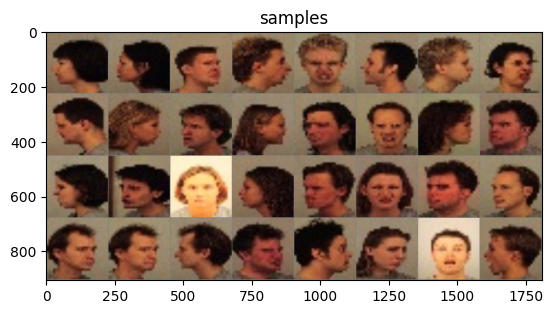

In [8]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.5, 0.5, 0.5])
    std = np.array([0.5, 0.5, 0.5])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title='samples')

Training the model
------------------

Now, let's write a general function to train a model. Here, we will
illustrate:

-  Scheduling the learning rate
-  Saving the best model

In the following, parameter ``scheduler`` is an LR scheduler object from
``torch.optim.lr_scheduler``.



In [9]:
from tqdm import tqdm

def train_model(model, criterion, optimizer, scheduler, dataloaders, writer=None, i=0,  num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                scheduler.step()
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in tqdm(dataloaders[phase]):
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))


            writer.add_scalar(phase+"/loss", epoch_loss, epoch)
            writer.add_scalar(phase+"/acc", epoch_acc, epoch)


            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()


    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, best_acc

Visualizing the model predictions

In [10]:
import imageio
import os
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

def visualize_model_misclassified(model, dataloader, class_names, save_dir='misclassified', num_images=15, columns=3):
    os.makedirs(save_dir, exist_ok=True)
    was_training = model.training
    model.eval()
    images_so_far = 0
    rows = (num_images + columns - 1) // columns
    fig, axes = plt.subplots(rows, columns, figsize=(columns * 4, rows * 4))
    axes = axes.flatten()

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                if preds[j] != labels[j]:
                    if images_so_far >= num_images:
                        break

                    # --- Display in grid ---
                    ax = axes[images_so_far]
                    ax.axis('off')
                    ax.set_title(f'Pred: {class_names[int(preds[j])]},\nTrue: {class_names[int(labels[j])]}', fontsize=9)
                    imshow(inputs.cpu().data[j], ax=ax)

                    # --- Save image with overlay text ---
                    img = inputs[j].cpu().numpy().transpose(1, 2, 0)
                    img = (img * 0.5 + 0.5) * 255
                    img = img.astype(np.uint8)
                    img_pil = Image.fromarray(img)

                    draw = ImageDraw.Draw(img_pil)
                    font = ImageFont.load_default()
                    text = f'Predicted: {class_names[int(preds[j])]} | True: {class_names[int(labels[j])]}'
                    draw.rectangle([10, 10, 280, 25], fill=(255, 255, 255))
                    draw.text((10, 10), text, font=font, fill=(0, 0, 0))

                    img_pil.save(f'{save_dir}/misclassified_{images_so_far + 1}.jpg')

                    images_so_far += 1

    for k in range(images_so_far, len(axes)):
        axes[k].axis('off')

    plt.tight_layout()
    plt.show()
    model.train(mode=was_training)


def imshow(inp, ax=None, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.5, 0.5, 0.5])
    std = np.array([0.5, 0.5, 0.5])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    if ax is None:
        plt.imshow(inp)
    else:
        ax.imshow(inp)
    if title is not None:
        ax.set_title(title)


Finetuning the convnet
----------------------

Load a pretrained model and reset final fully connected layer.




Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:02<00:00, 228MB/s]
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:227: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(


Epoch 0/19
----------


100%|██████████| 138/138 [00:17<00:00,  7.94it/s]


train Loss: 1.9497 Acc: 0.1667


100%|██████████| 16/16 [00:01<00:00, 15.83it/s]


val Loss: 1.9054 Acc: 0.1980

Epoch 1/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.68it/s]


train Loss: 1.8180 Acc: 0.2678


100%|██████████| 16/16 [00:00<00:00, 16.16it/s]


val Loss: 1.6247 Acc: 0.3449

Epoch 2/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.70it/s]


train Loss: 1.5133 Acc: 0.3905


100%|██████████| 16/16 [00:00<00:00, 16.42it/s]


val Loss: 1.3217 Acc: 0.4959

Epoch 3/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.76it/s]


train Loss: 1.2594 Acc: 0.5070


100%|██████████| 16/16 [00:01<00:00, 15.13it/s]


val Loss: 1.1284 Acc: 0.5673

Epoch 4/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.76it/s]


train Loss: 1.0758 Acc: 0.5857


100%|██████████| 16/16 [00:00<00:00, 16.58it/s]


val Loss: 1.1348 Acc: 0.5980

Epoch 5/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.78it/s]


train Loss: 0.8638 Acc: 0.6710


100%|██████████| 16/16 [00:00<00:00, 16.05it/s]


val Loss: 0.9071 Acc: 0.6571

Epoch 6/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.73it/s]


train Loss: 0.8019 Acc: 0.6882


100%|██████████| 16/16 [00:00<00:00, 16.43it/s]


val Loss: 0.8982 Acc: 0.6673

Epoch 7/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.73it/s]


train Loss: 0.7695 Acc: 0.7054


100%|██████████| 16/16 [00:00<00:00, 16.17it/s]


val Loss: 0.8875 Acc: 0.6612

Epoch 8/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.68it/s]


train Loss: 0.7434 Acc: 0.7102


100%|██████████| 16/16 [00:01<00:00, 15.96it/s]


val Loss: 0.8772 Acc: 0.6898

Epoch 9/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.71it/s]


train Loss: 0.7180 Acc: 0.7145


100%|██████████| 16/16 [00:00<00:00, 16.21it/s]


val Loss: 0.8735 Acc: 0.6673

Epoch 10/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.72it/s]


train Loss: 0.6994 Acc: 0.7308


100%|██████████| 16/16 [00:01<00:00, 15.72it/s]


val Loss: 0.8702 Acc: 0.6857

Epoch 11/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.71it/s]


train Loss: 0.6551 Acc: 0.7476


100%|██████████| 16/16 [00:00<00:00, 16.36it/s]


val Loss: 0.8443 Acc: 0.6878

Epoch 12/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.69it/s]


train Loss: 0.6532 Acc: 0.7558


100%|██████████| 16/16 [00:00<00:00, 16.31it/s]


val Loss: 0.8417 Acc: 0.6898

Epoch 13/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.75it/s]


train Loss: 0.6460 Acc: 0.7587


100%|██████████| 16/16 [00:00<00:00, 16.19it/s]


val Loss: 0.8424 Acc: 0.6959

Epoch 14/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.72it/s]


train Loss: 0.6460 Acc: 0.7560


100%|██████████| 16/16 [00:00<00:00, 16.00it/s]


val Loss: 0.8401 Acc: 0.6959

Epoch 15/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.71it/s]


train Loss: 0.6418 Acc: 0.7571


100%|██████████| 16/16 [00:00<00:00, 16.13it/s]


val Loss: 0.8427 Acc: 0.6837

Epoch 16/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.67it/s]


train Loss: 0.6412 Acc: 0.7478


100%|██████████| 16/16 [00:00<00:00, 16.32it/s]


val Loss: 0.8401 Acc: 0.6816

Epoch 17/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.68it/s]


train Loss: 0.6434 Acc: 0.7512


100%|██████████| 16/16 [00:01<00:00, 15.99it/s]


val Loss: 0.8400 Acc: 0.6857

Epoch 18/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.70it/s]


train Loss: 0.6327 Acc: 0.7560


100%|██████████| 16/16 [00:00<00:00, 16.21it/s]


val Loss: 0.8397 Acc: 0.6898

Epoch 19/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.74it/s]


train Loss: 0.6351 Acc: 0.7608


100%|██████████| 16/16 [00:00<00:00, 16.19it/s]


val Loss: 0.8391 Acc: 0.6878

Training complete in 5m 38s
Best val Acc: 0.695918
Showing misclassified examples for fold 0...


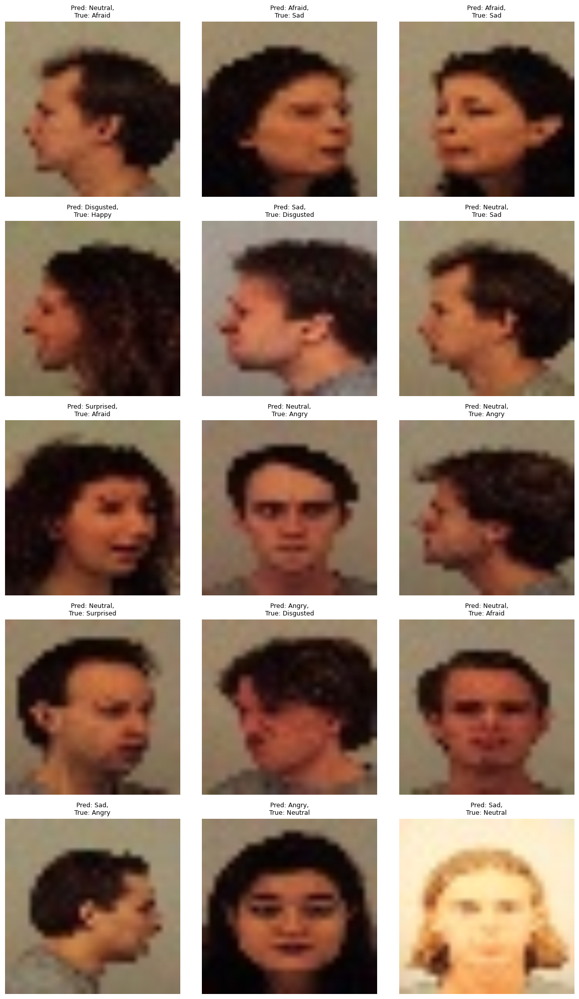




------------------------------------
 Accuracies  [0.6959183673469388]



Epoch 0/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.58it/s]


train Loss: 1.9416 Acc: 0.1719


100%|██████████| 16/16 [00:01<00:00, 15.62it/s]


val Loss: 1.8218 Acc: 0.2612

Epoch 1/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.59it/s]


train Loss: 1.7232 Acc: 0.3104


100%|██████████| 16/16 [00:01<00:00, 15.70it/s]


val Loss: 1.4589 Acc: 0.4102

Epoch 2/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.60it/s]


train Loss: 1.3926 Acc: 0.4458


100%|██████████| 16/16 [00:00<00:00, 16.10it/s]


val Loss: 1.2563 Acc: 0.5306

Epoch 3/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.60it/s]


train Loss: 1.1757 Acc: 0.5342


100%|██████████| 16/16 [00:01<00:00, 15.97it/s]


val Loss: 1.1557 Acc: 0.5367

Epoch 4/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.55it/s]


train Loss: 1.0279 Acc: 0.5986


100%|██████████| 16/16 [00:01<00:00, 15.66it/s]


val Loss: 1.0298 Acc: 0.5898

Epoch 5/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.53it/s]


train Loss: 0.8234 Acc: 0.6814


100%|██████████| 16/16 [00:01<00:00, 15.74it/s]


val Loss: 0.8866 Acc: 0.6633

Epoch 6/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.55it/s]


train Loss: 0.7613 Acc: 0.7059


100%|██████████| 16/16 [00:01<00:00, 15.50it/s]


val Loss: 0.8602 Acc: 0.6796

Epoch 7/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.52it/s]


train Loss: 0.7269 Acc: 0.7218


100%|██████████| 16/16 [00:01<00:00, 15.85it/s]


val Loss: 0.8443 Acc: 0.6776

Epoch 8/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.53it/s]


train Loss: 0.6996 Acc: 0.7279


100%|██████████| 16/16 [00:01<00:00, 15.83it/s]


val Loss: 0.8362 Acc: 0.6939

Epoch 9/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.63it/s]


train Loss: 0.6790 Acc: 0.7351


100%|██████████| 16/16 [00:01<00:00, 15.63it/s]


val Loss: 0.8168 Acc: 0.6857

Epoch 10/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.60it/s]


train Loss: 0.6594 Acc: 0.7562


100%|██████████| 16/16 [00:01<00:00, 15.92it/s]


val Loss: 0.8162 Acc: 0.6857

Epoch 11/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.61it/s]


train Loss: 0.6279 Acc: 0.7590


100%|██████████| 16/16 [00:01<00:00, 15.53it/s]


val Loss: 0.8010 Acc: 0.6918

Epoch 12/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.57it/s]


train Loss: 0.6171 Acc: 0.7662


100%|██████████| 16/16 [00:01<00:00, 15.42it/s]


val Loss: 0.7996 Acc: 0.6918

Epoch 13/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.53it/s]


train Loss: 0.6107 Acc: 0.7673


100%|██████████| 16/16 [00:01<00:00, 15.76it/s]


val Loss: 0.7985 Acc: 0.6918

Epoch 14/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.60it/s]


train Loss: 0.6126 Acc: 0.7707


100%|██████████| 16/16 [00:00<00:00, 16.04it/s]


val Loss: 0.8024 Acc: 0.6939

Epoch 15/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.54it/s]


train Loss: 0.6015 Acc: 0.7710


100%|██████████| 16/16 [00:01<00:00, 15.91it/s]


val Loss: 0.7976 Acc: 0.6939

Epoch 16/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.61it/s]


train Loss: 0.6082 Acc: 0.7726


100%|██████████| 16/16 [00:01<00:00, 15.69it/s]


val Loss: 0.7975 Acc: 0.6939

Epoch 17/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.59it/s]


train Loss: 0.5983 Acc: 0.7766


100%|██████████| 16/16 [00:01<00:00, 15.84it/s]


val Loss: 0.7968 Acc: 0.6918

Epoch 18/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.54it/s]


train Loss: 0.6080 Acc: 0.7732


100%|██████████| 16/16 [00:01<00:00, 15.84it/s]


val Loss: 0.7968 Acc: 0.6898

Epoch 19/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.56it/s]


train Loss: 0.6057 Acc: 0.7696


100%|██████████| 16/16 [00:01<00:00, 15.71it/s]


val Loss: 0.7970 Acc: 0.6918

Training complete in 5m 42s
Best val Acc: 0.693878
Showing misclassified examples for fold 1...


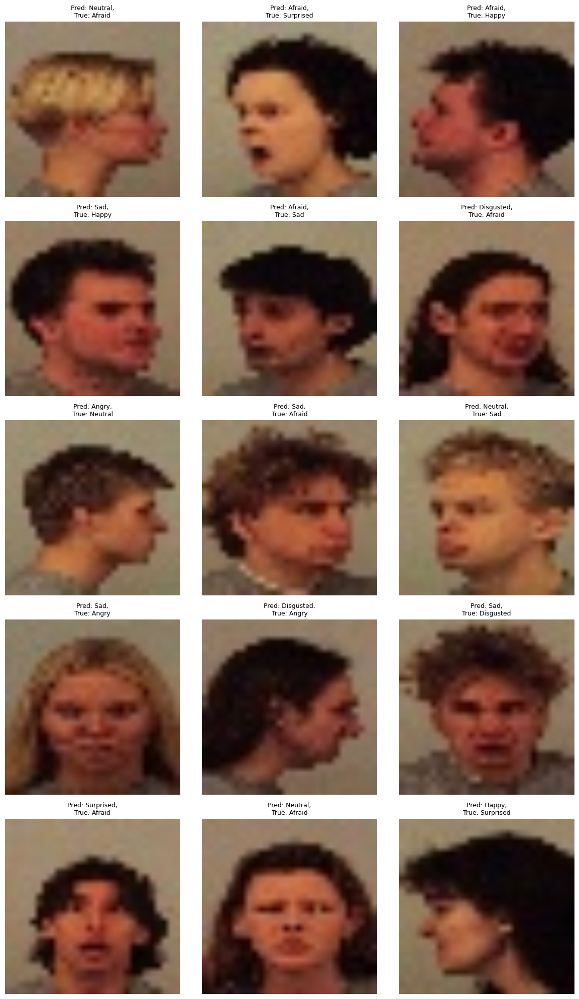




------------------------------------
 Accuracies  [0.6959183673469388, 0.6938775510204083]



Epoch 0/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.39it/s]


train Loss: 1.9331 Acc: 0.1812


100%|██████████| 16/16 [00:01<00:00, 15.49it/s]


val Loss: 1.8998 Acc: 0.1816

Epoch 1/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.47it/s]


train Loss: 1.7469 Acc: 0.2821


100%|██████████| 16/16 [00:01<00:00, 15.77it/s]


val Loss: 1.5295 Acc: 0.4184

Epoch 2/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.53it/s]


train Loss: 1.3980 Acc: 0.4524


100%|██████████| 16/16 [00:00<00:00, 16.03it/s]


val Loss: 1.1684 Acc: 0.5408

Epoch 3/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.47it/s]


train Loss: 1.1803 Acc: 0.5331


100%|██████████| 16/16 [00:01<00:00, 15.83it/s]


val Loss: 1.0187 Acc: 0.6163

Epoch 4/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.38it/s]


train Loss: 1.0598 Acc: 0.5884


100%|██████████| 16/16 [00:01<00:00, 15.46it/s]


val Loss: 1.0186 Acc: 0.6265

Epoch 5/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.46it/s]


train Loss: 0.8230 Acc: 0.6823


100%|██████████| 16/16 [00:01<00:00, 15.90it/s]


val Loss: 0.8638 Acc: 0.6551

Epoch 6/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.56it/s]


train Loss: 0.7600 Acc: 0.7032


100%|██████████| 16/16 [00:01<00:00, 15.19it/s]


val Loss: 0.8283 Acc: 0.6673

Epoch 7/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.44it/s]


train Loss: 0.7297 Acc: 0.7116


100%|██████████| 16/16 [00:01<00:00, 14.78it/s]


val Loss: 0.8133 Acc: 0.6939

Epoch 8/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.42it/s]


train Loss: 0.7105 Acc: 0.7209


100%|██████████| 16/16 [00:00<00:00, 16.05it/s]


val Loss: 0.7978 Acc: 0.7000

Epoch 9/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.46it/s]


train Loss: 0.6892 Acc: 0.7333


100%|██████████| 16/16 [00:01<00:00, 14.76it/s]


val Loss: 0.8065 Acc: 0.6980

Epoch 10/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.46it/s]


train Loss: 0.6736 Acc: 0.7363


100%|██████████| 16/16 [00:01<00:00, 15.11it/s]


val Loss: 0.7884 Acc: 0.7163

Epoch 11/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.50it/s]


train Loss: 0.6218 Acc: 0.7585


100%|██████████| 16/16 [00:01<00:00, 15.69it/s]


val Loss: 0.7722 Acc: 0.7020

Epoch 12/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.45it/s]


train Loss: 0.6208 Acc: 0.7617


100%|██████████| 16/16 [00:01<00:00, 15.77it/s]


val Loss: 0.7723 Acc: 0.7020

Epoch 13/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.52it/s]


train Loss: 0.6132 Acc: 0.7673


100%|██████████| 16/16 [00:01<00:00, 15.03it/s]


val Loss: 0.7811 Acc: 0.7102

Epoch 14/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.41it/s]


train Loss: 0.6121 Acc: 0.7639


100%|██████████| 16/16 [00:01<00:00, 15.51it/s]


val Loss: 0.7753 Acc: 0.6980

Epoch 15/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.45it/s]


train Loss: 0.6110 Acc: 0.7615


100%|██████████| 16/16 [00:01<00:00, 14.93it/s]


val Loss: 0.7733 Acc: 0.7020

Epoch 16/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.53it/s]


train Loss: 0.6047 Acc: 0.7646


100%|██████████| 16/16 [00:01<00:00, 14.96it/s]


val Loss: 0.7749 Acc: 0.6980

Epoch 17/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.54it/s]


train Loss: 0.6060 Acc: 0.7619


100%|██████████| 16/16 [00:01<00:00, 15.53it/s]


val Loss: 0.7705 Acc: 0.7061

Epoch 18/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.52it/s]


train Loss: 0.5993 Acc: 0.7687


100%|██████████| 16/16 [00:00<00:00, 16.04it/s]


val Loss: 0.7686 Acc: 0.7082

Epoch 19/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.50it/s]


train Loss: 0.6128 Acc: 0.7626


100%|██████████| 16/16 [00:01<00:00, 15.65it/s]


val Loss: 0.7678 Acc: 0.7082

Training complete in 5m 47s
Best val Acc: 0.716327
Showing misclassified examples for fold 2...


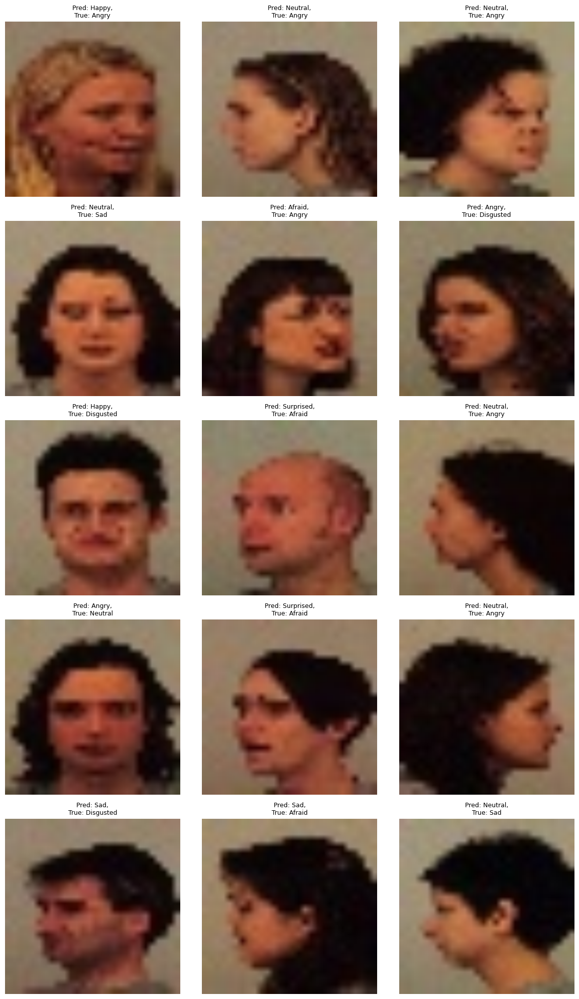




------------------------------------
 Accuracies  [0.6959183673469388, 0.6938775510204083, 0.7163265306122449]



Epoch 0/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.47it/s]


train Loss: 1.9354 Acc: 0.1857


100%|██████████| 16/16 [00:01<00:00, 15.08it/s]


val Loss: 1.8527 Acc: 0.2592

Epoch 1/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.48it/s]


train Loss: 1.7405 Acc: 0.3150


100%|██████████| 16/16 [00:00<00:00, 16.20it/s]


val Loss: 1.4940 Acc: 0.4347

Epoch 2/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.49it/s]


train Loss: 1.3868 Acc: 0.4558


100%|██████████| 16/16 [00:01<00:00, 15.98it/s]


val Loss: 1.1519 Acc: 0.5286

Epoch 3/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.34it/s]


train Loss: 1.1831 Acc: 0.5329


100%|██████████| 16/16 [00:01<00:00, 15.81it/s]


val Loss: 1.1950 Acc: 0.5714

Epoch 4/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.42it/s]


train Loss: 1.0555 Acc: 0.5984


100%|██████████| 16/16 [00:01<00:00, 15.70it/s]


val Loss: 1.0244 Acc: 0.5918

Epoch 5/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.46it/s]


train Loss: 0.8193 Acc: 0.6819


100%|██████████| 16/16 [00:01<00:00, 15.62it/s]


val Loss: 0.9085 Acc: 0.6286

Epoch 6/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.57it/s]


train Loss: 0.7691 Acc: 0.7034


100%|██████████| 16/16 [00:01<00:00, 15.85it/s]


val Loss: 0.9025 Acc: 0.6469

Epoch 7/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.51it/s]


train Loss: 0.7331 Acc: 0.7177


100%|██████████| 16/16 [00:00<00:00, 16.18it/s]


val Loss: 0.8876 Acc: 0.6633

Epoch 8/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.50it/s]


train Loss: 0.7134 Acc: 0.7247


100%|██████████| 16/16 [00:01<00:00, 15.53it/s]


val Loss: 0.8603 Acc: 0.6694

Epoch 9/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.46it/s]


train Loss: 0.6845 Acc: 0.7381


100%|██████████| 16/16 [00:00<00:00, 16.04it/s]


val Loss: 0.8412 Acc: 0.6816

Epoch 10/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.43it/s]


train Loss: 0.6635 Acc: 0.7410


100%|██████████| 16/16 [00:01<00:00, 15.41it/s]


val Loss: 0.8518 Acc: 0.6673

Epoch 11/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.54it/s]


train Loss: 0.6251 Acc: 0.7596


100%|██████████| 16/16 [00:01<00:00, 15.38it/s]


val Loss: 0.8284 Acc: 0.6796

Epoch 12/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.35it/s]


train Loss: 0.6206 Acc: 0.7615


100%|██████████| 16/16 [00:01<00:00, 15.49it/s]


val Loss: 0.8258 Acc: 0.6857

Epoch 13/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.48it/s]


train Loss: 0.6158 Acc: 0.7664


100%|██████████| 16/16 [00:01<00:00, 15.17it/s]


val Loss: 0.8272 Acc: 0.6898

Epoch 14/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.51it/s]


train Loss: 0.6052 Acc: 0.7667


100%|██████████| 16/16 [00:00<00:00, 16.12it/s]


val Loss: 0.8282 Acc: 0.6918

Epoch 15/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.50it/s]


train Loss: 0.6069 Acc: 0.7717


100%|██████████| 16/16 [00:01<00:00, 15.66it/s]


val Loss: 0.8275 Acc: 0.6939

Epoch 16/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.54it/s]


train Loss: 0.6059 Acc: 0.7741


100%|██████████| 16/16 [00:00<00:00, 16.08it/s]


val Loss: 0.8273 Acc: 0.6959

Epoch 17/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.40it/s]


train Loss: 0.5971 Acc: 0.7748


100%|██████████| 16/16 [00:01<00:00, 15.85it/s]


val Loss: 0.8263 Acc: 0.6918

Epoch 18/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.50it/s]


train Loss: 0.6018 Acc: 0.7703


100%|██████████| 16/16 [00:01<00:00, 15.82it/s]


val Loss: 0.8261 Acc: 0.6898

Epoch 19/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.55it/s]


train Loss: 0.5944 Acc: 0.7760


100%|██████████| 16/16 [00:01<00:00, 15.98it/s]


val Loss: 0.8260 Acc: 0.6898

Training complete in 5m 46s
Best val Acc: 0.695918
Showing misclassified examples for fold 3...


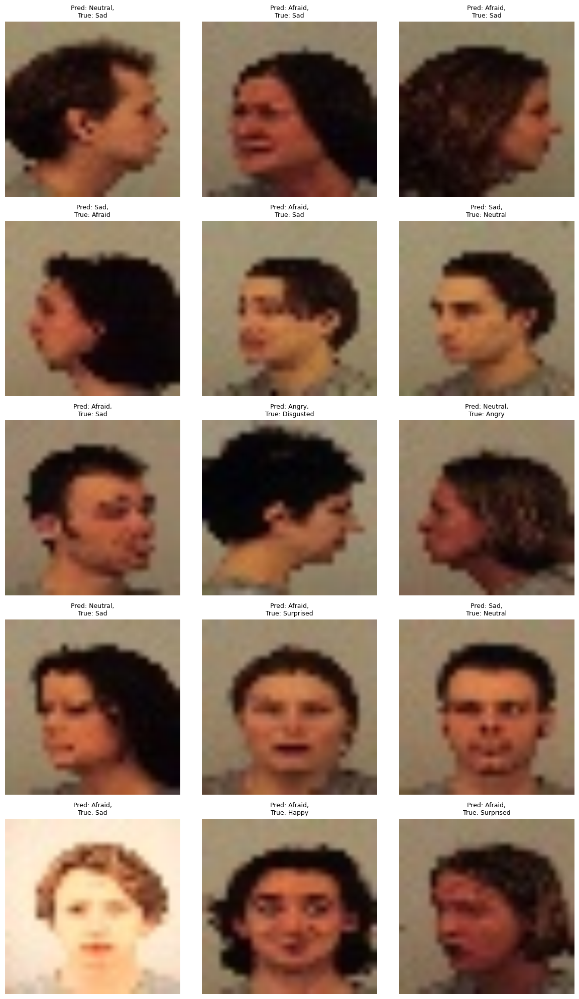




------------------------------------
 Accuracies  [0.6959183673469388, 0.6938775510204083, 0.7163265306122449, 0.6959183673469388]



Epoch 0/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.49it/s]


train Loss: 1.9388 Acc: 0.1796


100%|██████████| 16/16 [00:01<00:00, 15.32it/s]


val Loss: 1.9027 Acc: 0.1959

Epoch 1/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.48it/s]


train Loss: 1.7548 Acc: 0.2907


100%|██████████| 16/16 [00:01<00:00, 15.05it/s]


val Loss: 1.5615 Acc: 0.3592

Epoch 2/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.50it/s]


train Loss: 1.3504 Acc: 0.4769


100%|██████████| 16/16 [00:01<00:00, 15.90it/s]


val Loss: 1.1987 Acc: 0.5265

Epoch 3/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.40it/s]


train Loss: 1.1819 Acc: 0.5474


100%|██████████| 16/16 [00:01<00:00, 15.62it/s]


val Loss: 1.1734 Acc: 0.5429

Epoch 4/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.41it/s]


train Loss: 1.0018 Acc: 0.6181


100%|██████████| 16/16 [00:01<00:00, 15.12it/s]


val Loss: 0.9901 Acc: 0.6000

Epoch 5/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.50it/s]


train Loss: 0.7890 Acc: 0.6975


100%|██████████| 16/16 [00:01<00:00, 15.64it/s]


val Loss: 0.9068 Acc: 0.6510

Epoch 6/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.55it/s]


train Loss: 0.7307 Acc: 0.7236


100%|██████████| 16/16 [00:01<00:00, 14.43it/s]


val Loss: 0.8925 Acc: 0.6490

Epoch 7/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.51it/s]


train Loss: 0.7181 Acc: 0.7247


100%|██████████| 16/16 [00:01<00:00, 15.86it/s]


val Loss: 0.8904 Acc: 0.6673

Epoch 8/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.59it/s]


train Loss: 0.6865 Acc: 0.7399


100%|██████████| 16/16 [00:01<00:00, 15.15it/s]


val Loss: 0.8952 Acc: 0.6612

Epoch 9/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.45it/s]


train Loss: 0.6671 Acc: 0.7447


100%|██████████| 16/16 [00:01<00:00, 15.59it/s]


val Loss: 0.8767 Acc: 0.6592

Epoch 10/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.39it/s]


train Loss: 0.6412 Acc: 0.7546


100%|██████████| 16/16 [00:01<00:00, 14.81it/s]


val Loss: 0.8665 Acc: 0.6510

Epoch 11/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.41it/s]


train Loss: 0.6117 Acc: 0.7696


100%|██████████| 16/16 [00:01<00:00, 15.74it/s]


val Loss: 0.8500 Acc: 0.6531

Epoch 12/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.50it/s]


train Loss: 0.6021 Acc: 0.7712


100%|██████████| 16/16 [00:01<00:00, 15.61it/s]


val Loss: 0.8497 Acc: 0.6592

Epoch 13/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.43it/s]


train Loss: 0.5947 Acc: 0.7773


100%|██████████| 16/16 [00:01<00:00, 15.48it/s]


val Loss: 0.8505 Acc: 0.6531

Epoch 14/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.47it/s]


train Loss: 0.5934 Acc: 0.7739


100%|██████████| 16/16 [00:01<00:00, 15.39it/s]


val Loss: 0.8511 Acc: 0.6571

Epoch 15/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.47it/s]


train Loss: 0.5807 Acc: 0.7828


100%|██████████| 16/16 [00:01<00:00, 15.84it/s]


val Loss: 0.8545 Acc: 0.6612

Epoch 16/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.43it/s]


train Loss: 0.5884 Acc: 0.7796


100%|██████████| 16/16 [00:01<00:00, 15.62it/s]


val Loss: 0.8525 Acc: 0.6653

Epoch 17/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.47it/s]


train Loss: 0.5790 Acc: 0.7834


100%|██████████| 16/16 [00:01<00:00, 15.83it/s]


val Loss: 0.8511 Acc: 0.6653

Epoch 18/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.41it/s]


train Loss: 0.5841 Acc: 0.7819


100%|██████████| 16/16 [00:01<00:00, 14.93it/s]


val Loss: 0.8510 Acc: 0.6633

Epoch 19/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.55it/s]


train Loss: 0.5828 Acc: 0.7796


100%|██████████| 16/16 [00:01<00:00, 15.92it/s]


val Loss: 0.8504 Acc: 0.6633

Training complete in 5m 47s
Best val Acc: 0.667347
Showing misclassified examples for fold 4...


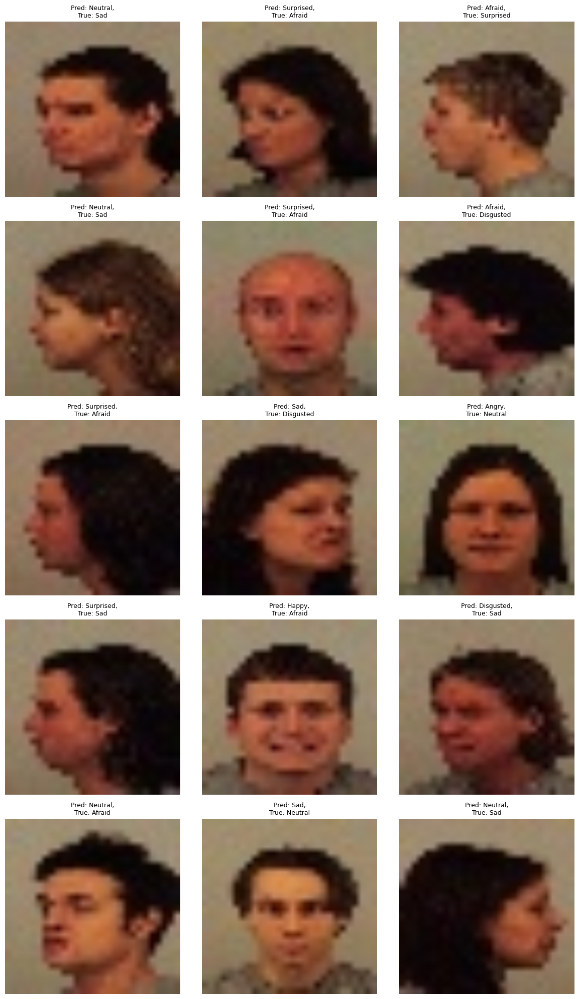




------------------------------------
 Accuracies  [0.6959183673469388, 0.6938775510204083, 0.7163265306122449, 0.6959183673469388, 0.6673469387755102]



Epoch 0/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.45it/s]


train Loss: 1.9358 Acc: 0.1707


100%|██████████| 16/16 [00:01<00:00, 15.91it/s]


val Loss: 1.8599 Acc: 0.2327

Epoch 1/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.51it/s]


train Loss: 1.6972 Acc: 0.3315


100%|██████████| 16/16 [00:01<00:00, 15.08it/s]


val Loss: 1.4261 Acc: 0.4286

Epoch 2/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.44it/s]


train Loss: 1.3254 Acc: 0.4819


100%|██████████| 16/16 [00:01<00:00, 15.29it/s]


val Loss: 1.1987 Acc: 0.5265

Epoch 3/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.51it/s]


train Loss: 1.1461 Acc: 0.5578


100%|██████████| 16/16 [00:01<00:00, 15.67it/s]


val Loss: 1.1688 Acc: 0.5653

Epoch 4/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.53it/s]


train Loss: 1.0221 Acc: 0.6091


100%|██████████| 16/16 [00:01<00:00, 15.66it/s]


val Loss: 1.0449 Acc: 0.5959

Epoch 5/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.48it/s]


train Loss: 0.7967 Acc: 0.6914


100%|██████████| 16/16 [00:01<00:00, 15.35it/s]


val Loss: 0.8999 Acc: 0.6408

Epoch 6/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.53it/s]


train Loss: 0.7410 Acc: 0.7136


100%|██████████| 16/16 [00:01<00:00, 15.86it/s]


val Loss: 0.8911 Acc: 0.6429

Epoch 7/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.49it/s]


train Loss: 0.7184 Acc: 0.7234


100%|██████████| 16/16 [00:01<00:00, 15.90it/s]


val Loss: 0.8865 Acc: 0.6388

Epoch 8/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.53it/s]


train Loss: 0.6786 Acc: 0.7415


100%|██████████| 16/16 [00:00<00:00, 16.06it/s]


val Loss: 0.8788 Acc: 0.6592

Epoch 9/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.49it/s]


train Loss: 0.6619 Acc: 0.7458


100%|██████████| 16/16 [00:01<00:00, 15.58it/s]


val Loss: 0.8624 Acc: 0.6571

Epoch 10/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.56it/s]


train Loss: 0.6366 Acc: 0.7558


100%|██████████| 16/16 [00:01<00:00, 15.73it/s]


val Loss: 0.8659 Acc: 0.6755

Epoch 11/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.55it/s]


train Loss: 0.5916 Acc: 0.7769


100%|██████████| 16/16 [00:01<00:00, 15.53it/s]


val Loss: 0.8564 Acc: 0.6735

Epoch 12/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.41it/s]


train Loss: 0.6016 Acc: 0.7689


100%|██████████| 16/16 [00:01<00:00, 15.20it/s]


val Loss: 0.8562 Acc: 0.6755

Epoch 13/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.45it/s]


train Loss: 0.5948 Acc: 0.7753


100%|██████████| 16/16 [00:01<00:00, 15.38it/s]


val Loss: 0.8590 Acc: 0.6714

Epoch 14/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.49it/s]


train Loss: 0.5933 Acc: 0.7701


100%|██████████| 16/16 [00:01<00:00, 15.83it/s]


val Loss: 0.8590 Acc: 0.6796

Epoch 15/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.53it/s]


train Loss: 0.5886 Acc: 0.7782


100%|██████████| 16/16 [00:01<00:00, 15.59it/s]


val Loss: 0.8582 Acc: 0.6816

Epoch 16/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.57it/s]


train Loss: 0.5828 Acc: 0.7782


100%|██████████| 16/16 [00:01<00:00, 14.54it/s]


val Loss: 0.8560 Acc: 0.6776

Epoch 17/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.53it/s]


train Loss: 0.5930 Acc: 0.7728


100%|██████████| 16/16 [00:01<00:00, 15.95it/s]


val Loss: 0.8549 Acc: 0.6837

Epoch 18/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.65it/s]


train Loss: 0.5748 Acc: 0.7814


100%|██████████| 16/16 [00:00<00:00, 16.10it/s]


val Loss: 0.8541 Acc: 0.6816

Epoch 19/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.43it/s]


train Loss: 0.5801 Acc: 0.7760


100%|██████████| 16/16 [00:01<00:00, 15.57it/s]


val Loss: 0.8541 Acc: 0.6816

Training complete in 5m 45s
Best val Acc: 0.683673
Showing misclassified examples for fold 5...


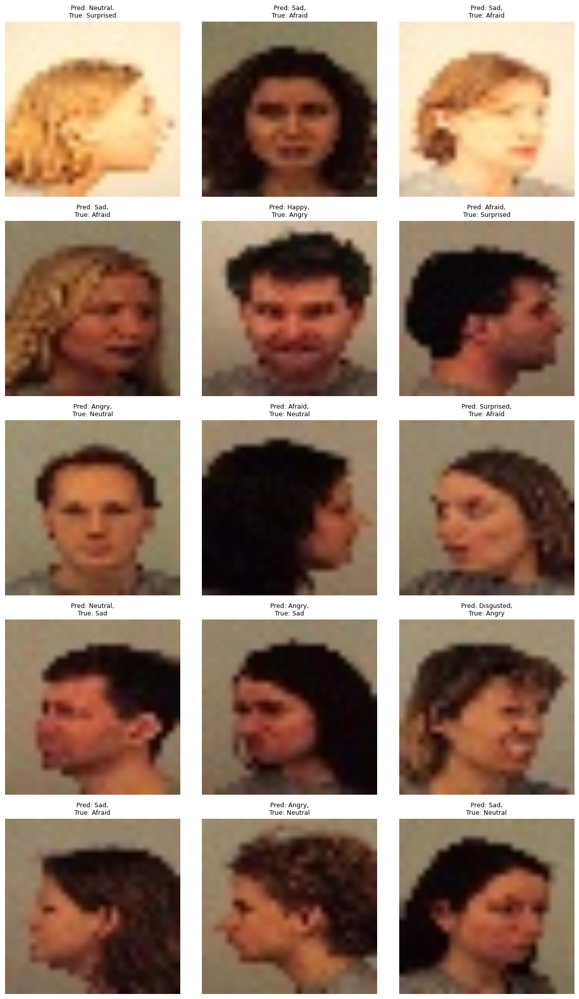




------------------------------------
 Accuracies  [0.6959183673469388, 0.6938775510204083, 0.7163265306122449, 0.6959183673469388, 0.6673469387755102, 0.6836734693877552]



Epoch 0/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.45it/s]


train Loss: 1.9355 Acc: 0.1757


100%|██████████| 16/16 [00:01<00:00, 15.75it/s]


val Loss: 1.8653 Acc: 0.2367

Epoch 1/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.39it/s]


train Loss: 1.7741 Acc: 0.2839


100%|██████████| 16/16 [00:01<00:00, 15.51it/s]


val Loss: 1.5080 Acc: 0.4122

Epoch 2/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.47it/s]


train Loss: 1.3834 Acc: 0.4535


100%|██████████| 16/16 [00:01<00:00, 15.81it/s]


val Loss: 1.2080 Acc: 0.5490

Epoch 3/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.54it/s]


train Loss: 1.1549 Acc: 0.5488


100%|██████████| 16/16 [00:01<00:00, 15.19it/s]


val Loss: 1.1457 Acc: 0.5551

Epoch 4/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.43it/s]


train Loss: 1.0096 Acc: 0.6141


100%|██████████| 16/16 [00:01<00:00, 15.37it/s]


val Loss: 1.0070 Acc: 0.6184

Epoch 5/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.44it/s]


train Loss: 0.7903 Acc: 0.7020


100%|██████████| 16/16 [00:01<00:00, 15.10it/s]


val Loss: 0.9184 Acc: 0.6367

Epoch 6/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.56it/s]


train Loss: 0.7376 Acc: 0.7134


100%|██████████| 16/16 [00:01<00:00, 15.58it/s]


val Loss: 0.8689 Acc: 0.6510

Epoch 7/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.46it/s]


train Loss: 0.7099 Acc: 0.7252


100%|██████████| 16/16 [00:01<00:00, 14.20it/s]


val Loss: 0.8599 Acc: 0.6673

Epoch 8/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.51it/s]


train Loss: 0.6862 Acc: 0.7336


100%|██████████| 16/16 [00:01<00:00, 15.38it/s]


val Loss: 0.8451 Acc: 0.6898

Epoch 9/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.59it/s]


train Loss: 0.6655 Acc: 0.7490


100%|██████████| 16/16 [00:01<00:00, 14.72it/s]


val Loss: 0.8720 Acc: 0.6735

Epoch 10/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.54it/s]


train Loss: 0.6468 Acc: 0.7515


100%|██████████| 16/16 [00:01<00:00, 15.92it/s]


val Loss: 0.8541 Acc: 0.6878

Epoch 11/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.44it/s]


train Loss: 0.5993 Acc: 0.7748


100%|██████████| 16/16 [00:01<00:00, 14.93it/s]


val Loss: 0.8233 Acc: 0.6918

Epoch 12/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.49it/s]


train Loss: 0.5995 Acc: 0.7703


100%|██████████| 16/16 [00:01<00:00, 14.93it/s]


val Loss: 0.8196 Acc: 0.6857

Epoch 13/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.47it/s]


train Loss: 0.5890 Acc: 0.7803


100%|██████████| 16/16 [00:01<00:00, 15.79it/s]


val Loss: 0.8198 Acc: 0.6878

Epoch 14/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.46it/s]


train Loss: 0.5971 Acc: 0.7757


100%|██████████| 16/16 [00:01<00:00, 15.37it/s]


val Loss: 0.8154 Acc: 0.6816

Epoch 15/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.48it/s]


train Loss: 0.5851 Acc: 0.7782


100%|██████████| 16/16 [00:01<00:00, 15.96it/s]


val Loss: 0.8166 Acc: 0.6857

Epoch 16/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.52it/s]


train Loss: 0.5852 Acc: 0.7751


100%|██████████| 16/16 [00:01<00:00, 14.88it/s]


val Loss: 0.8143 Acc: 0.6939

Epoch 17/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.49it/s]


train Loss: 0.5704 Acc: 0.7821


100%|██████████| 16/16 [00:01<00:00, 15.88it/s]


val Loss: 0.8155 Acc: 0.6918

Epoch 18/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.54it/s]


train Loss: 0.5824 Acc: 0.7837


100%|██████████| 16/16 [00:01<00:00, 15.82it/s]


val Loss: 0.8166 Acc: 0.6918

Epoch 19/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.54it/s]


train Loss: 0.5762 Acc: 0.7834


100%|██████████| 16/16 [00:01<00:00, 15.37it/s]


val Loss: 0.8165 Acc: 0.6898

Training complete in 5m 46s
Best val Acc: 0.693878
Showing misclassified examples for fold 6...


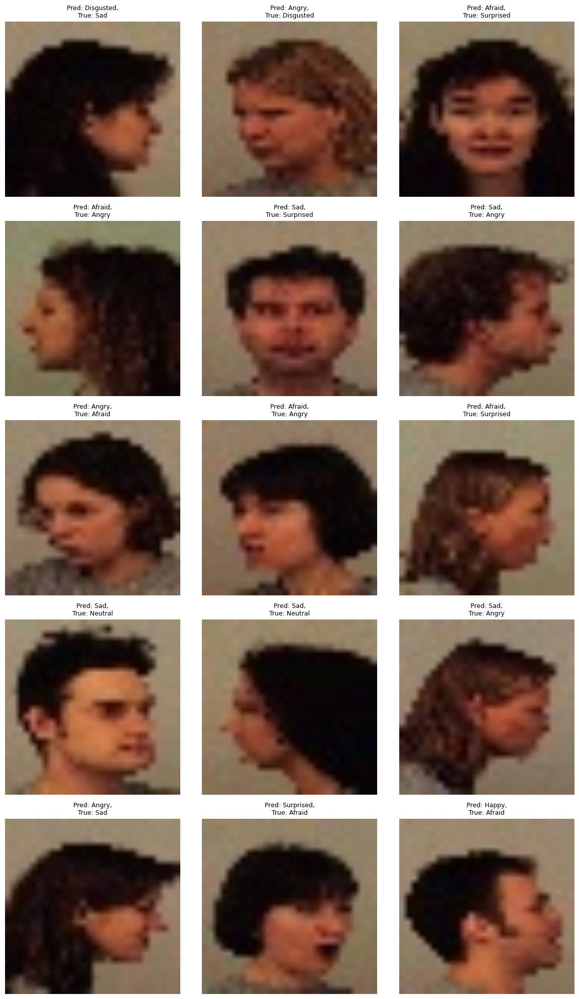




------------------------------------
 Accuracies  [0.6959183673469388, 0.6938775510204083, 0.7163265306122449, 0.6959183673469388, 0.6673469387755102, 0.6836734693877552, 0.6938775510204083]



Epoch 0/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.53it/s]


train Loss: 1.9342 Acc: 0.1866


100%|██████████| 16/16 [00:01<00:00, 15.67it/s]


val Loss: 1.8365 Acc: 0.2490

Epoch 1/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.55it/s]


train Loss: 1.7674 Acc: 0.2912


100%|██████████| 16/16 [00:01<00:00, 15.40it/s]


val Loss: 1.5881 Acc: 0.3531

Epoch 2/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.52it/s]


train Loss: 1.3719 Acc: 0.4578


100%|██████████| 16/16 [00:01<00:00, 15.65it/s]


val Loss: 1.1909 Acc: 0.5347

Epoch 3/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.43it/s]


train Loss: 1.1488 Acc: 0.5551


100%|██████████| 16/16 [00:00<00:00, 16.16it/s]


val Loss: 0.9903 Acc: 0.6286

Epoch 4/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.52it/s]


train Loss: 1.0136 Acc: 0.6045


100%|██████████| 16/16 [00:01<00:00, 15.73it/s]


val Loss: 0.9291 Acc: 0.6490

Epoch 5/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.51it/s]


train Loss: 0.8096 Acc: 0.6884


100%|██████████| 16/16 [00:01<00:00, 15.90it/s]


val Loss: 0.8295 Acc: 0.6796

Epoch 6/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.45it/s]


train Loss: 0.7405 Acc: 0.7188


100%|██████████| 16/16 [00:01<00:00, 15.85it/s]


val Loss: 0.8217 Acc: 0.6673

Epoch 7/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.55it/s]


train Loss: 0.7057 Acc: 0.7229


100%|██████████| 16/16 [00:01<00:00, 16.00it/s]


val Loss: 0.8095 Acc: 0.6837

Epoch 8/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.50it/s]


train Loss: 0.6885 Acc: 0.7354


100%|██████████| 16/16 [00:01<00:00, 15.97it/s]


val Loss: 0.7852 Acc: 0.6959

Epoch 9/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.55it/s]


train Loss: 0.6660 Acc: 0.7406


100%|██████████| 16/16 [00:01<00:00, 15.62it/s]


val Loss: 0.7845 Acc: 0.6980

Epoch 10/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.53it/s]


train Loss: 0.6533 Acc: 0.7494


100%|██████████| 16/16 [00:01<00:00, 15.52it/s]


val Loss: 0.8083 Acc: 0.6898

Epoch 11/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.49it/s]


train Loss: 0.6074 Acc: 0.7635


100%|██████████| 16/16 [00:01<00:00, 15.34it/s]


val Loss: 0.7584 Acc: 0.6980

Epoch 12/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.50it/s]


train Loss: 0.6037 Acc: 0.7717


100%|██████████| 16/16 [00:01<00:00, 15.74it/s]


val Loss: 0.7565 Acc: 0.7082

Epoch 13/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.55it/s]


train Loss: 0.5942 Acc: 0.7676


100%|██████████| 16/16 [00:01<00:00, 15.80it/s]


val Loss: 0.7551 Acc: 0.7000

Epoch 14/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.56it/s]


train Loss: 0.5885 Acc: 0.7762


100%|██████████| 16/16 [00:01<00:00, 14.76it/s]


val Loss: 0.7575 Acc: 0.7020

Epoch 15/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.50it/s]


train Loss: 0.5982 Acc: 0.7694


100%|██████████| 16/16 [00:01<00:00, 15.23it/s]


val Loss: 0.7544 Acc: 0.7061

Epoch 16/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.50it/s]


train Loss: 0.5829 Acc: 0.7769


100%|██████████| 16/16 [00:01<00:00, 15.64it/s]


val Loss: 0.7575 Acc: 0.7102

Epoch 17/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.57it/s]


train Loss: 0.5887 Acc: 0.7694


100%|██████████| 16/16 [00:01<00:00, 15.85it/s]


val Loss: 0.7564 Acc: 0.7102

Epoch 18/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.55it/s]


train Loss: 0.5813 Acc: 0.7791


100%|██████████| 16/16 [00:01<00:00, 15.86it/s]


val Loss: 0.7564 Acc: 0.7102

Epoch 19/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.55it/s]


train Loss: 0.5828 Acc: 0.7710


100%|██████████| 16/16 [00:01<00:00, 15.69it/s]


val Loss: 0.7561 Acc: 0.7041

Training complete in 5m 45s
Best val Acc: 0.710204
Showing misclassified examples for fold 7...


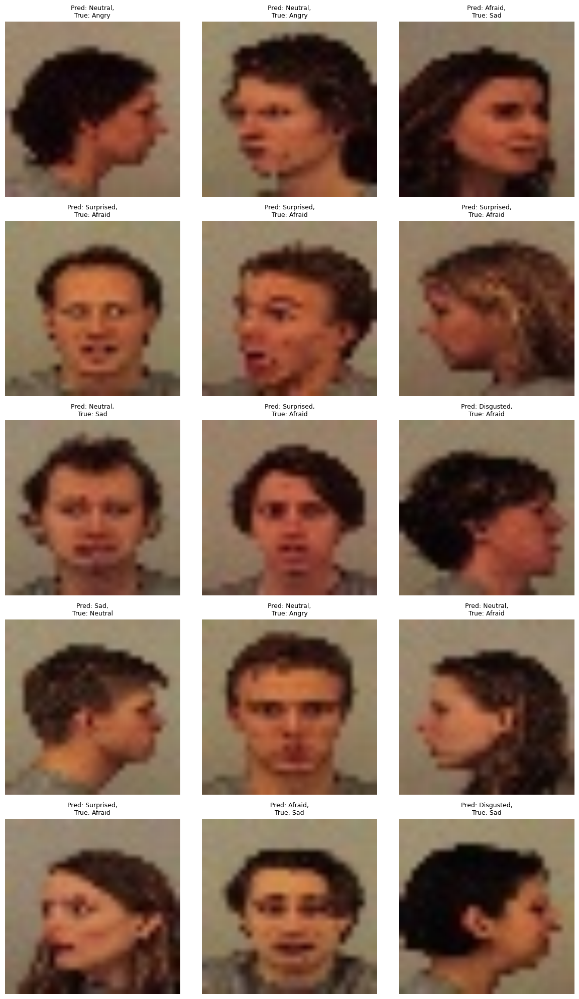




------------------------------------
 Accuracies  [0.6959183673469388, 0.6938775510204083, 0.7163265306122449, 0.6959183673469388, 0.6673469387755102, 0.6836734693877552, 0.6938775510204083, 0.7102040816326531]



Epoch 0/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.44it/s]


train Loss: 1.9278 Acc: 0.1884


100%|██████████| 16/16 [00:01<00:00, 15.83it/s]


val Loss: 1.8846 Acc: 0.1980

Epoch 1/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.51it/s]


train Loss: 1.7113 Acc: 0.3054


100%|██████████| 16/16 [00:01<00:00, 15.94it/s]


val Loss: 1.5052 Acc: 0.4102

Epoch 2/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.41it/s]


train Loss: 1.3238 Acc: 0.4819


100%|██████████| 16/16 [00:01<00:00, 15.09it/s]


val Loss: 1.2212 Acc: 0.5245

Epoch 3/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.55it/s]


train Loss: 1.1227 Acc: 0.5594


100%|██████████| 16/16 [00:01<00:00, 15.62it/s]


val Loss: 1.4388 Acc: 0.4163

Epoch 4/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.59it/s]


train Loss: 1.0573 Acc: 0.5887


100%|██████████| 16/16 [00:01<00:00, 15.44it/s]


val Loss: 1.1651 Acc: 0.5469

Epoch 5/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.55it/s]


train Loss: 0.8124 Acc: 0.6848


100%|██████████| 16/16 [00:01<00:00, 15.86it/s]


val Loss: 0.9442 Acc: 0.6306

Epoch 6/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.53it/s]


train Loss: 0.7413 Acc: 0.7082


100%|██████████| 16/16 [00:01<00:00, 15.06it/s]


val Loss: 0.9231 Acc: 0.6388

Epoch 7/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.43it/s]


train Loss: 0.7243 Acc: 0.7152


100%|██████████| 16/16 [00:01<00:00, 14.91it/s]


val Loss: 0.9153 Acc: 0.6469

Epoch 8/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.53it/s]


train Loss: 0.6850 Acc: 0.7401


100%|██████████| 16/16 [00:01<00:00, 14.97it/s]


val Loss: 0.8916 Acc: 0.6592

Epoch 9/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.58it/s]


train Loss: 0.6717 Acc: 0.7406


100%|██████████| 16/16 [00:01<00:00, 15.97it/s]


val Loss: 0.8848 Acc: 0.6816

Epoch 10/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.57it/s]


train Loss: 0.6523 Acc: 0.7528


100%|██████████| 16/16 [00:01<00:00, 15.34it/s]


val Loss: 0.9076 Acc: 0.6510

Epoch 11/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.47it/s]


train Loss: 0.6167 Acc: 0.7603


100%|██████████| 16/16 [00:01<00:00, 15.04it/s]


val Loss: 0.8745 Acc: 0.6816

Epoch 12/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.50it/s]


train Loss: 0.6064 Acc: 0.7705


100%|██████████| 16/16 [00:01<00:00, 14.78it/s]


val Loss: 0.8724 Acc: 0.6776

Epoch 13/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.61it/s]


train Loss: 0.6028 Acc: 0.7692


100%|██████████| 16/16 [00:01<00:00, 15.87it/s]


val Loss: 0.8729 Acc: 0.6816

Epoch 14/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.56it/s]


train Loss: 0.6041 Acc: 0.7667


100%|██████████| 16/16 [00:01<00:00, 15.20it/s]


val Loss: 0.8717 Acc: 0.6816

Epoch 15/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.55it/s]


train Loss: 0.5970 Acc: 0.7678


100%|██████████| 16/16 [00:01<00:00, 15.82it/s]


val Loss: 0.8752 Acc: 0.6796

Epoch 16/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.54it/s]


train Loss: 0.5866 Acc: 0.7805


100%|██████████| 16/16 [00:01<00:00, 15.23it/s]


val Loss: 0.8752 Acc: 0.6816

Epoch 17/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.62it/s]


train Loss: 0.5883 Acc: 0.7744


100%|██████████| 16/16 [00:01<00:00, 15.29it/s]


val Loss: 0.8741 Acc: 0.6816

Epoch 18/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.59it/s]


train Loss: 0.5915 Acc: 0.7735


100%|██████████| 16/16 [00:01<00:00, 15.13it/s]


val Loss: 0.8739 Acc: 0.6816

Epoch 19/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.59it/s]


train Loss: 0.5832 Acc: 0.7732


100%|██████████| 16/16 [00:01<00:00, 15.94it/s]


val Loss: 0.8737 Acc: 0.6816

Training complete in 5m 44s
Best val Acc: 0.681633
Showing misclassified examples for fold 8...


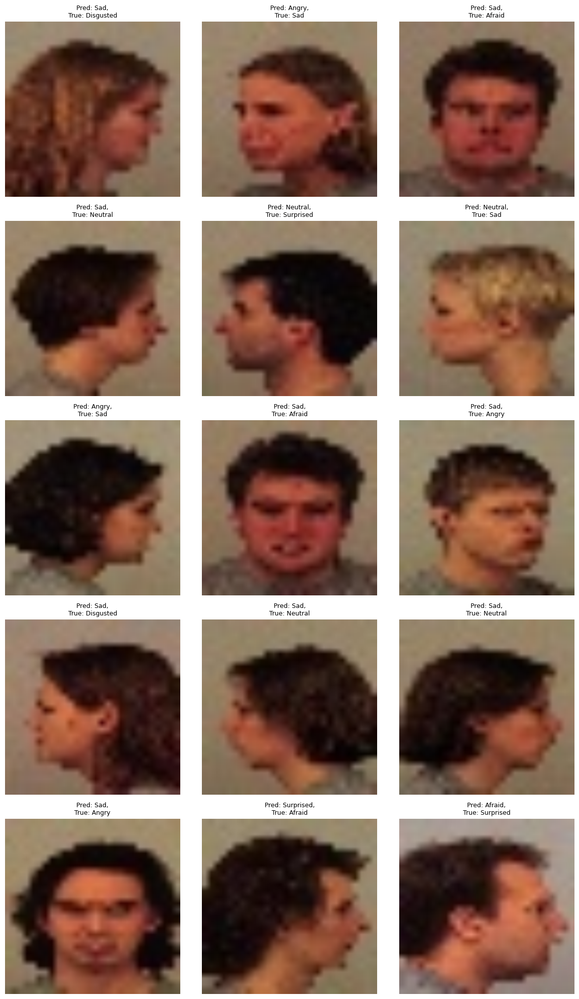




------------------------------------
 Accuracies  [0.6959183673469388, 0.6938775510204083, 0.7163265306122449, 0.6959183673469388, 0.6673469387755102, 0.6836734693877552, 0.6938775510204083, 0.7102040816326531, 0.6816326530612246]



Epoch 0/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.50it/s]


train Loss: 1.9472 Acc: 0.1671


100%|██████████| 16/16 [00:01<00:00, 15.42it/s]


val Loss: 1.8898 Acc: 0.2224

Epoch 1/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.50it/s]


train Loss: 1.7522 Acc: 0.2905


100%|██████████| 16/16 [00:01<00:00, 15.14it/s]


val Loss: 1.4526 Acc: 0.4327

Epoch 2/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.57it/s]


train Loss: 1.3676 Acc: 0.4710


100%|██████████| 16/16 [00:01<00:00, 15.90it/s]


val Loss: 1.3191 Acc: 0.4939

Epoch 3/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.59it/s]


train Loss: 1.1378 Acc: 0.5576


100%|██████████| 16/16 [00:01<00:00, 14.50it/s]


val Loss: 1.1611 Acc: 0.5367

Epoch 4/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.54it/s]


train Loss: 1.0129 Acc: 0.6091


100%|██████████| 16/16 [00:01<00:00, 15.82it/s]


val Loss: 1.0936 Acc: 0.6082

Epoch 5/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.53it/s]


train Loss: 0.7865 Acc: 0.6964


100%|██████████| 16/16 [00:01<00:00, 15.09it/s]


val Loss: 0.8706 Acc: 0.6469

Epoch 6/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.52it/s]


train Loss: 0.7257 Acc: 0.7270


100%|██████████| 16/16 [00:01<00:00, 15.52it/s]


val Loss: 0.8592 Acc: 0.6633

Epoch 7/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.55it/s]


train Loss: 0.7009 Acc: 0.7313


100%|██████████| 16/16 [00:01<00:00, 15.22it/s]


val Loss: 0.8322 Acc: 0.6673

Epoch 8/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.54it/s]


train Loss: 0.6782 Acc: 0.7390


100%|██████████| 16/16 [00:01<00:00, 14.70it/s]


val Loss: 0.8189 Acc: 0.6735

Epoch 9/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.52it/s]


train Loss: 0.6669 Acc: 0.7508


100%|██████████| 16/16 [00:01<00:00, 15.43it/s]


val Loss: 0.8112 Acc: 0.6898

Epoch 10/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.56it/s]


train Loss: 0.6362 Acc: 0.7562


100%|██████████| 16/16 [00:00<00:00, 16.09it/s]


val Loss: 0.8315 Acc: 0.6898

Epoch 11/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.53it/s]


train Loss: 0.5993 Acc: 0.7794


100%|██████████| 16/16 [00:01<00:00, 15.72it/s]


val Loss: 0.8041 Acc: 0.6837

Epoch 12/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.48it/s]


train Loss: 0.5994 Acc: 0.7760


100%|██████████| 16/16 [00:01<00:00, 15.00it/s]


val Loss: 0.8061 Acc: 0.6837

Epoch 13/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.51it/s]


train Loss: 0.5881 Acc: 0.7789


100%|██████████| 16/16 [00:01<00:00, 15.48it/s]


val Loss: 0.8038 Acc: 0.6837

Epoch 14/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.52it/s]


train Loss: 0.5806 Acc: 0.7812


100%|██████████| 16/16 [00:01<00:00, 15.61it/s]


val Loss: 0.8047 Acc: 0.6796

Epoch 15/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.54it/s]


train Loss: 0.5848 Acc: 0.7739


100%|██████████| 16/16 [00:01<00:00, 15.81it/s]


val Loss: 0.8003 Acc: 0.6776

Epoch 16/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.51it/s]


train Loss: 0.5830 Acc: 0.7798


100%|██████████| 16/16 [00:01<00:00, 15.13it/s]


val Loss: 0.7970 Acc: 0.6796

Epoch 17/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.54it/s]


train Loss: 0.5852 Acc: 0.7744


100%|██████████| 16/16 [00:01<00:00, 15.38it/s]


val Loss: 0.7988 Acc: 0.6796

Epoch 18/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.52it/s]


train Loss: 0.5754 Acc: 0.7884


100%|██████████| 16/16 [00:01<00:00, 15.41it/s]


val Loss: 0.7997 Acc: 0.6857

Epoch 19/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.53it/s]


train Loss: 0.5844 Acc: 0.7769


100%|██████████| 16/16 [00:01<00:00, 15.69it/s]


val Loss: 0.7997 Acc: 0.6837

Training complete in 5m 45s
Best val Acc: 0.689796
Showing misclassified examples for fold 9...


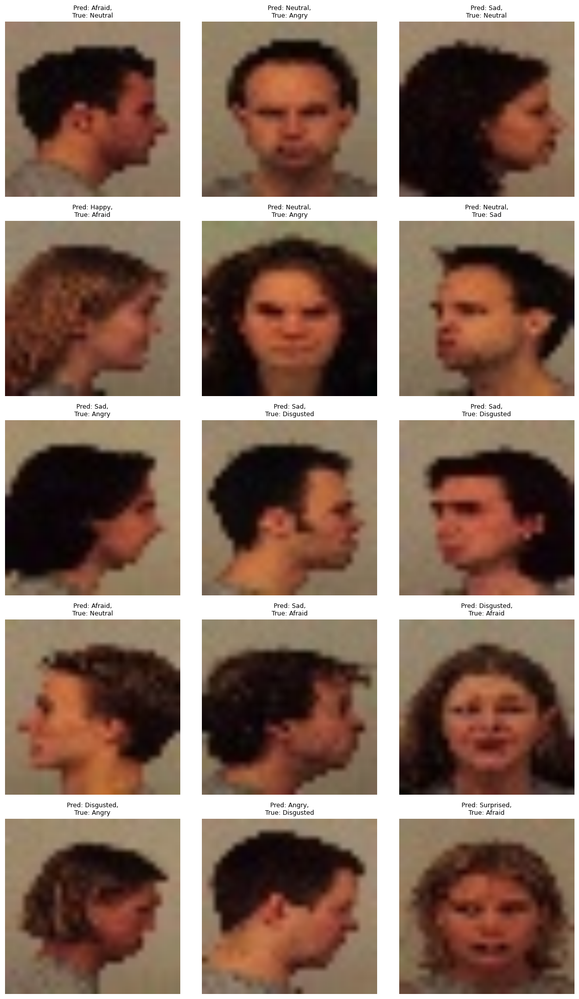




------------------------------------
 Accuracies  [0.6959183673469388, 0.6938775510204083, 0.7163265306122449, 0.6959183673469388, 0.6673469387755102, 0.6836734693877552, 0.6938775510204083, 0.7102040816326531, 0.6816326530612246, 0.689795918367347]





'best_model/VGG19_best_model.pt'

In [11]:
import torch
import os
import numpy as np
import shutil
from torch import nn, optim
from torch.optim import lr_scheduler
from torchvision import models
from torch.utils.tensorboard import SummaryWriter

accuracies = []
index = list(np.random.permutation(4900))

best_overall_acc = 0.0
best_model_path = ""

for i in range(10):
    idx = {
        'val': index[490 * i:490 * (i + 1)],
        'train': index[:i * 490] + index[((i + 1) * 490):]
    }

    dataloaders = {
        x: torch.utils.data.DataLoader(
            KDEFDataset(transforms_=data_transforms[x], idx=idx[x]),
            batch_size=32,
            shuffle=True
        )
        for x in ['train', 'val']
    }

    model_ft = models.vgg19(weights='IMAGENET1K_V1')
    num_ftrs = model_ft.classifier[6].in_features
    model_ft.classifier[6] = nn.Linear(num_ftrs, class_names)
    model_ft = model_ft.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)
    exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=6, gamma=0.1)

    logdir = f'./logs/VGG-19_kfold_{i}'
    os.makedirs(logdir, exist_ok=True)
    writer = SummaryWriter(logdir)

    os.makedirs('saved', exist_ok=True)

    model_ft, best_acc = train_model(
        model_ft,
        criterion,
        optimizer_ft,
        exp_lr_scheduler,
        dataloaders,
        writer,
        i,
        num_epochs=20
    )

    model_path = f'saved/model_fold_{i}.pt'
    torch.save(model_ft.state_dict(), model_path)

    if best_acc > best_overall_acc:
        best_overall_acc = best_acc
        best_model_path = model_path

    print(f"Showing misclassified examples for fold {i}...")
    visualize_model_misclassified(
        model=model_ft,
        dataloader=dataloaders['val'],
        class_names={
            0: "Afraid", 1: "Angry", 2: "Disgusted",
            3: "Happy", 4: "Neutral", 5: "Sad", 6: "Surprised"
        },
        save_dir=f'misclassified/fold_{i}',
        num_images=15,
    )

    accuracies.append(float(best_acc.cpu().numpy()))
    print("\n\n\n------------------------------------\n Accuracies ", accuracies)
    print("\n\n")


os.makedirs('best_model', exist_ok=True)
shutil.copy(best_model_path, 'best_model/VGG19_best_model.pt')



In [12]:
from google.colab import files

!zip -r VGG19_28x28_logs_best_model.zip logs misclassified best_model
files.download('VGG19_28x28_logs_best_model.zip')

  adding: logs/ (stored 0%)
  adding: logs/VGG-19_kfold_5/ (stored 0%)
  adding: logs/VGG-19_kfold_5/events.out.tfevents.1744964765.b53d238adf4a.4416.5 (deflated 61%)
  adding: logs/VGG-19_kfold_6/ (stored 0%)
  adding: logs/VGG-19_kfold_6/events.out.tfevents.1744965115.b53d238adf4a.4416.6 (deflated 61%)
  adding: logs/VGG-19_kfold_9/ (stored 0%)
  adding: logs/VGG-19_kfold_9/events.out.tfevents.1744966166.b53d238adf4a.4416.9 (deflated 58%)
  adding: logs/VGG-19_kfold_7/ (stored 0%)
  adding: logs/VGG-19_kfold_7/events.out.tfevents.1744965467.b53d238adf4a.4416.7 (deflated 61%)
  adding: logs/VGG-19_kfold_4/ (stored 0%)
  adding: logs/VGG-19_kfold_4/events.out.tfevents.1744964413.b53d238adf4a.4416.4 (deflated 61%)
  adding: logs/VGG-19_kfold_2/ (stored 0%)
  adding: logs/VGG-19_kfold_2/events.out.tfevents.1744963709.b53d238adf4a.4416.2 (deflated 61%)
  adding: logs/VGG-19_kfold_3/ (stored 0%)
  adding: logs/VGG-19_kfold_3/events.out.tfevents.1744964061.b53d238adf4a.4416.3 (deflated 61%)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>